In [12]:
from keras.datasets.cifar10 import load_data
(x_train, y_train), (x_test, y_test) = load_data()

170500096/170498071 [==============================] - 221s 1us/step


In [18]:
print(x_train.shape)
print(x_test.shape)

(50000, 32, 32, 3)
(10000, 32, 32, 3)


In [19]:
print(y_train.shape)
y_train

(50000, 1)


array([[6],
       [9],
       [9],
       ...,
       [9],
       [1],
       [1]], dtype=uint8)

In [20]:
trans = ["airplane", "automobile",
         "bird", "cat",
         "deer", "dog",
         "frog", "horse",
         "ship", "truck"]

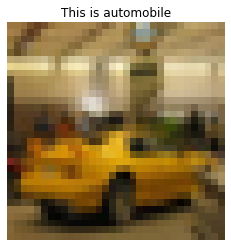

In [21]:
import random
import matplotlib.pyplot as plt
%matplotlib inline

idx = random.randint(0, 49999)
ans = y_train[idx][0]
plt.title("This is {}".format(trans[ans]))
plt.axis("off")
plt.imshow(x_train[idx])

In [28]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Flatten
model = Sequential()

model.add(Conv2D(64, 3,
                activation = "relu",
                padding = "same",
                input_shape = (32, 32, 3)))

model.add(MaxPooling2D())

model.add(Conv2D(128, 3,
                activation = "relu",
                padding = "same"))

model.add(MaxPooling2D())

model.add(Conv2D(256, 3,
                activation = "relu",
                padding = "same"))

model.add(MaxPooling2D())

#MLP
model.add(Flatten())
model.add(Dense(256, activation = "relu"))
model.add(Dropout(0.25))
model.add(Dense(10, activation = "softmax"))
model.summary()

# 1792 = (3 * 3 (size) * 3 (RGB) (one filter) * 64) + 64 (bias)
# 73856 = 3 * 3 * 64 * 128 + 128
# 295168 = 3 * 3 * 64 * 256 + 256

W1230 16:13:00.863155   120 deprecation_wrapper.py:119] From C:\Users\Chien Hua Lo\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:133: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W1230 16:13:00.876120   120 deprecation.py:506] From C:\Users\Chien Hua Lo\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:3445: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 32, 32, 64)        1792      
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 16, 16, 128)       73856     
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 8, 8, 256)         295168    
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 4, 4, 256)         0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 4096)              0         
__________

In [30]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer="adam",
              metrics=["accuracy"])

In [33]:
x_train_norm = x_train / 255
x_test_norm = x_test / 255

In [34]:
model.fit(x_train_norm, y_train,
         batch_size = 200,
         epochs = 10,
         validation_split = 0.1,
         verbose = 2)

W1230 16:30:25.718246   120 deprecation.py:323] From C:\Users\Chien Hua Lo\Anaconda3\lib\site-packages\tensorflow\python\ops\math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 45000 samples, validate on 5000 samples
Epoch 1/10
 - 199s - loss: 1.6425 - acc: 0.3969 - val_loss: 1.3388 - val_acc: 0.5186
Epoch 2/10
 - 194s - loss: 1.2348 - acc: 0.5572 - val_loss: 1.0857 - val_acc: 0.6206
Epoch 3/10
 - 216s - loss: 1.0309 - acc: 0.6370 - val_loss: 1.0200 - val_acc: 0.6410
Epoch 4/10
 - 229s - loss: 0.8906 - acc: 0.6872 - val_loss: 0.8484 - val_acc: 0.7068
Epoch 5/10
 - 210s - loss: 0.7955 - acc: 0.7205 - val_loss: 0.7700 - val_acc: 0.7358
Epoch 6/10
 - 228s - loss: 0.7065 - acc: 0.7535 - val_loss: 0.7608 - val_acc: 0.7322
Epoch 7/10
 - 213s - loss: 0.6322 - acc: 0.7804 - val_loss: 0.7299 - val_acc: 0.7488
Epoch 8/10
 - 216s - loss: 0.5594 - acc: 0.8052 - val_loss: 0.7361 - val_acc: 0.7508
Epoch 9/10
 - 186s - loss: 0.4927 - acc: 0.8254 - val_loss: 0.7468 - val_acc: 0.7520
Epoch 10/10
 - 199s - loss: 0.4290 - acc: 0.8491 - val_loss: 0.7032 - val_acc: 0.7730


In [35]:
model.evaluate(x_test_norm, y_test)

10000/10000 [==============================] - 11s 1ms/step


[0.7512938105583191, 0.7562]

In [36]:
import pandas as pd
from sklearn.metrics import confusion_matrix

pre = model.predict_classes(x_test_norm)
i = ["{}(真實)".format(i) for i in trans]
c = ["{}(預測)".format(i) for i in trans]

percents = []
for r in confusion_matrix(y_test, pre):
    percents.append(["{}%".format(round(n/sum(r)*100 ,2)) for n in r])

pd.DataFrame(percents, index = i, columns = c)

C:\Users\Chien Hua Lo\Anaconda3\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
C:\Users\Chien Hua Lo\Anaconda3\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
C:\Users\Chien Hua Lo\Anaconda3\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


,airplane(預測),automobile(預測),bird(預測),cat(預測),deer(預測),dog(預測),frog(預測),horse(預測),ship(預測),truck(預測)
airplane(真實),84.2%,1.3%,1.7%,1.5%,2.2%,1.1%,0.9%,1.2%,2.9%,3.0%
automobile(真實),1.8%,84.2%,0.4%,1.1%,0.2%,0.6%,1.0%,0.3%,2.3%,8.1%
bird(真實),7.9%,0.3%,56.8%,7.8%,8.6%,7.5%,5.9%,3.7%,0.9%,0.6%
cat(真實),1.8%,0.7%,3.4%,61.2%,6.5%,15.8%,6.0%,2.8%,1.1%,0.7%
deer(真實),2.0%,0.1%,3.5%,5.6%,75.4%,4.1%,3.4%,4.9%,0.9%,0.1%
dog(真實),1.0%,0.5%,2.3%,19.3%,3.8%,66.4%,1.8%,3.4%,0.6%,0.9%
frog(真實),0.8%,0.1%,2.7%,6.6%,2.9%,3.1%,81.9%,0.8%,0.7%,0.4%
horse(真實),1.7%,0.2%,2.0%,3.9%,5.2%,4.8%,0.4%,80.7%,0.2%,0.9%
ship(真實),6.8%,2.3%,1.0%,1.6%,1.0%,0.6%,0.6%,0.3%,84.2%,1.6%
truck(真實),3.5%,6.1%,1.2%,1.8%,0.3%,1.5%,0.7%,1.6%,2.1%,81.2%


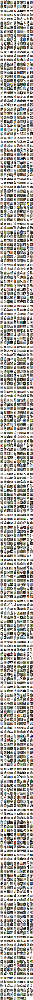

In [38]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

y_test = y_test.reshape(-1)
idx = np.nonzero(pre != y_test)[0]
pre_false_img = x_test[idx]
pre_false_label = y_test[idx] 
pre_false_pre = pre[idx]

width = 10
height = len(idx) // width + 1
plt.figure(figsize = (16, 510))

z = zip(pre_false_img, pre_false_label, pre_false_pre)
# (i, (z1, z2, z3))

for i, (img, label, p) in enumerate(z):
    plt.subplot(height, width, i+1)
    plt.title("[T]:{}\n[P]:{}".format(trans[label], trans[p]))
    plt.axis("off")
    result = plt.imshow(img, cmap = "gray")

result